In [34]:
from collections import OrderedDict
import torch
from neural_lam import constants, utils, vis, config
import matplotlib.pyplot as plt
import numpy as np

data_config = config.Config.from_file("../data_config.yaml")
static_data_dict = utils.load_static_data("meps_example")
model_lookup = OrderedDict()
kwargs = {}

prediction_path = "predictions"
output_path = "/Users/erila85/Library/CloudStorage/OneDrive-Linköpingsuniversitet/Desktop/git/Berzelius_code/neural-lam/plots/graph_efm"
time_step = 18 # 0-18, 3 hour intervals

# Models
model_lookup["prob_hi"] = "Graph-EFM"
model_lookup["diff"] = "Diffusion-LAM"

In [35]:
# Load the data

# Iterate through each model in model_lookup
for key, model_name in model_lookup.items():
    # Define the filenames for each prediction type
    filenames = {
        "target": f"{prediction_path}/{key}_target_1.pt",
        "ens_std": f"{prediction_path}/{key}_ens_std_1.pt",
        "ens_members": f"{prediction_path}/{key}_ens_members_1.pt",
        "ens_mean": f"{prediction_path}/{key}_ens_mean_1.pt",
        "border": f"{prediction_path}/{key}_border_1.pt",
    }
    
    # Load the predictions into a dictionary
    predictions = {}
    for pred_type, filepath in filenames.items():
        try:
            predictions[pred_type] = torch.load(filepath, map_location=torch.device('cpu'))
            print(f"Loaded {pred_type} from {filepath}, with shape {predictions[pred_type].shape}")
        except FileNotFoundError:
            print(f"Warning: File {filepath} not found.")
    
    # Store the predictions in the model_lookup under the current key
    model_lookup[key] = {
        "model_name": model_name,
        "predictions": predictions,
    }

/var/folders/16/8yvsfpws3tz2q2ll2_qyslpm0000gr/T/ipykernel_28250/364851401.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  predictions[pred_type] = torch.load(filepath,

Loaded target from predictions/prob_hi_target_1.pt, with shape torch.Size([19, 63784, 17])
Loaded ens_std from predictions/prob_hi_ens_std_1.pt, with shape torch.Size([19, 63784, 17])
Loaded ens_members from predictions/prob_hi_ens_members_1.pt, with shape torch.Size([6, 19, 63784, 17])
Loaded ens_mean from predictions/prob_hi_ens_mean_1.pt, with shape torch.Size([19, 63784, 17])
Loaded target from predictions/diff_target_1.pt, with shape torch.Size([19, 54064, 17])
Loaded ens_std from predictions/diff_ens_std_1.pt, with shape torch.Size([19, 54064, 17])
Loaded ens_members from predictions/diff_ens_members_1.pt, with shape torch.Size([25, 19, 54064, 17])
Loaded ens_mean from predictions/diff_ens_mean_1.pt, with shape torch.Size([19, 54064, 17])
Loaded border from predictions/diff_border_1.pt, with shape torch.Size([19, 9720, 17])


In [36]:
def plot_on_axis(
    ax,
    data,
    border_data=None,
    obs_mask=None,
    vmin=None,
    vmax=None,
    ax_title=None,
    cmap="plasma",
    grid_limits=None,
    origin="lower",
):
    """
    Plot weather state on given axis
    """
    # if data_config is None:
    #     data_config = config.Config.from_file("/proj/berzelius-2022-164/users/x_erila/neural-lam/neural_lam/data_config.yaml")
    # Set up masking of border region
    if obs_mask is None:
        pixel_alpha = 1
        data_grid = data.reshape(*constants.GRID_SHAPE).cpu().numpy()
    else:
        mask_reshaped = obs_mask.reshape(*constants.FULL_GRID_SHAPE)
        pixel_alpha = (
            mask_reshaped.clamp(0.7, 1).cpu().numpy()
        )  # Faded border region
        # Create a blank array for the full image

        if border_data is not None:
            reconstructed_image = np.zeros(constants.FULL_GRID_SHAPE[0] * constants.FULL_GRID_SHAPE[1])

            # Fill in the interior and boundary regions
            reconstructed_image[obs_mask.cpu().numpy()] = data.cpu().numpy()
            reconstructed_image[~obs_mask.cpu().numpy()] = border_data.cpu().numpy()

            # Reshape to 2D for plotting
            data_grid = reconstructed_image.reshape(*constants.FULL_GRID_SHAPE)
        else:
            data_grid = data.reshape(*constants.FULL_GRID_SHAPE).cpu().numpy()


    # ax.coastlines()  # Add coastline outlines
    im = ax.imshow(
        data_grid,
        origin=origin,
        alpha=pixel_alpha,
        vmin=vmin,
        vmax=vmax,
        cmap=cmap,
        extent=grid_limits,
    )

    if ax_title:
        ax.set_title(ax_title, size=15)
    return im

Text(0.5, 1.0, 'Ground Truth')

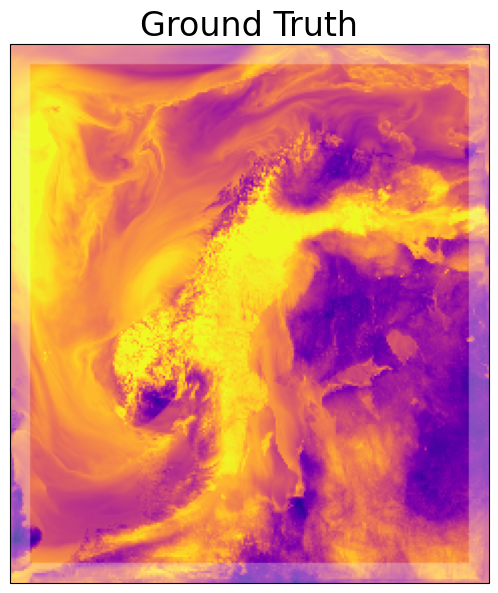

In [37]:
# Plot the data
# Visualize the full state
fig, axes = plt.subplots(
    1,
    1,
    figsize=(13, 7),
    subplot_kw={"projection": data_config.coords_projection},
)
plot_on_axis(axes, model_lookup["prob_hi"]["predictions"]["target"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes.set_title("Ground Truth", size=24)

Vmin: 0.23947709798812866, Vmax: 1.0697733163833618
Vmin_std: 0.0, Vmax_std: 0.19607722759246826


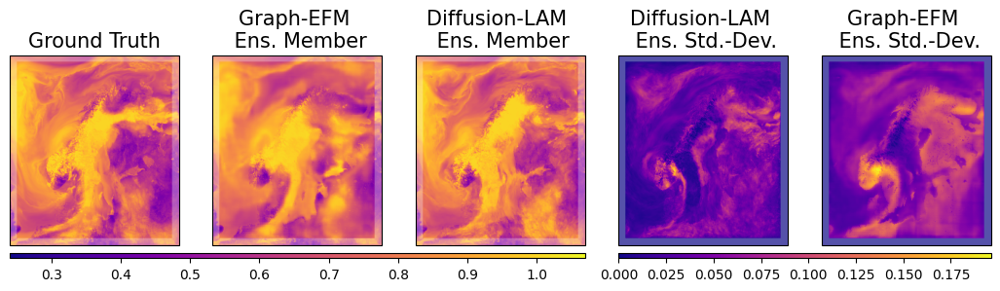

In [115]:
var_dim = 4

# Set Vmin and Vmax for samples
# Dynamically compute vmin and vmax across all models in model_lookup
vmin = float("inf")
vmax = float("-inf")
vmin_std = float("inf")
vmax_std = float("-inf")

for model in model_lookup.values():
    predictions = model["predictions"]
    vmin = min(
    predictions["target"][..., var_dim].min(),
    predictions["ens_mean"][..., var_dim].min(),
    predictions["ens_members"][..., var_dim].min(),
    vmin
    )

    vmax = max(
        predictions["target"][..., var_dim].max(),
        predictions["ens_mean"][..., var_dim].max(),
        predictions["ens_members"][..., var_dim].max(),
        vmax
    )

    # Set Vmin and Vmax for std
    vmax_std = max(predictions["ens_std"][..., var_dim].max(), vmax_std)
    vmin_std = min(predictions["ens_std"][..., var_dim].min(), vmin_std)

print(f"Vmin: {vmin}, Vmax: {vmax}")
print(f"Vmin_std: {vmin_std}, Vmax_std: {vmax_std}")

# Comparison with Graph-EFM
fig, axes = plt.subplots(
    1,
    5,
    figsize=(13, 7),
    subplot_kw={"projection": data_config.coords_projection},
)
im = plot_on_axis(axes[0], model_lookup["prob_hi"]["predictions"]["target"][time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], vmin=vmin, vmax=vmax)
axes[0].set_title("Ground Truth", size=15)
fig.colorbar(im, ax=axes[0:3], orientation='horizontal', location="bottom", label=data_config.dataset.var_units[var_dim], shrink=1, pad=0.015, aspect=120)

plot_on_axis(axes[1], model_lookup["prob_hi"]["predictions"]["ens_members"][0, time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], vmin=vmin, vmax=vmax)
axes[1].set_title("Graph-EFM \n Ens. Member", size=15)

plot_on_axis(axes[2], model_lookup["diff"]["predictions"]["ens_members"][0, time_step, :, var_dim], border_data=model_lookup["diff"]["predictions"]["border"][time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], vmin=vmin, vmax=vmax)
axes[2].set_title("Diffusion-LAM \n Ens. Member", size=15)

im = plot_on_axis(axes[3], model_lookup["diff"]["predictions"]["ens_std"][time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], border_data=model_lookup["diff"]["predictions"]["border"][time_step, :, var_dim]*0, vmin=vmin_std, vmax=vmax_std)
axes[3].set_title("Diffusion-LAM \n Ens. Std.-Dev.", size=15)

im = plot_on_axis(axes[4], model_lookup["prob_hi"]["predictions"]["ens_std"][time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], vmin=vmin_std, vmax=vmax_std)
axes[4].set_title("Graph-EFM \n Ens. Std.-Dev.", size=15)
# fig.colorbar(im, ax=axes[-1], orientation='vertical', location="right", label="Ens. Std.-Dev", shrink=0.4)
fig.colorbar(im, ax=axes[3:6], orientation='horizontal', location="bottom", label=data_config.dataset.var_units[var_dim], shrink=1, pad=0.015, aspect=80)

# #plt.tight_layout()
fig.savefig(f'{output_path}/ens_comparison_3.pdf', format='pdf', bbox_inches='tight')

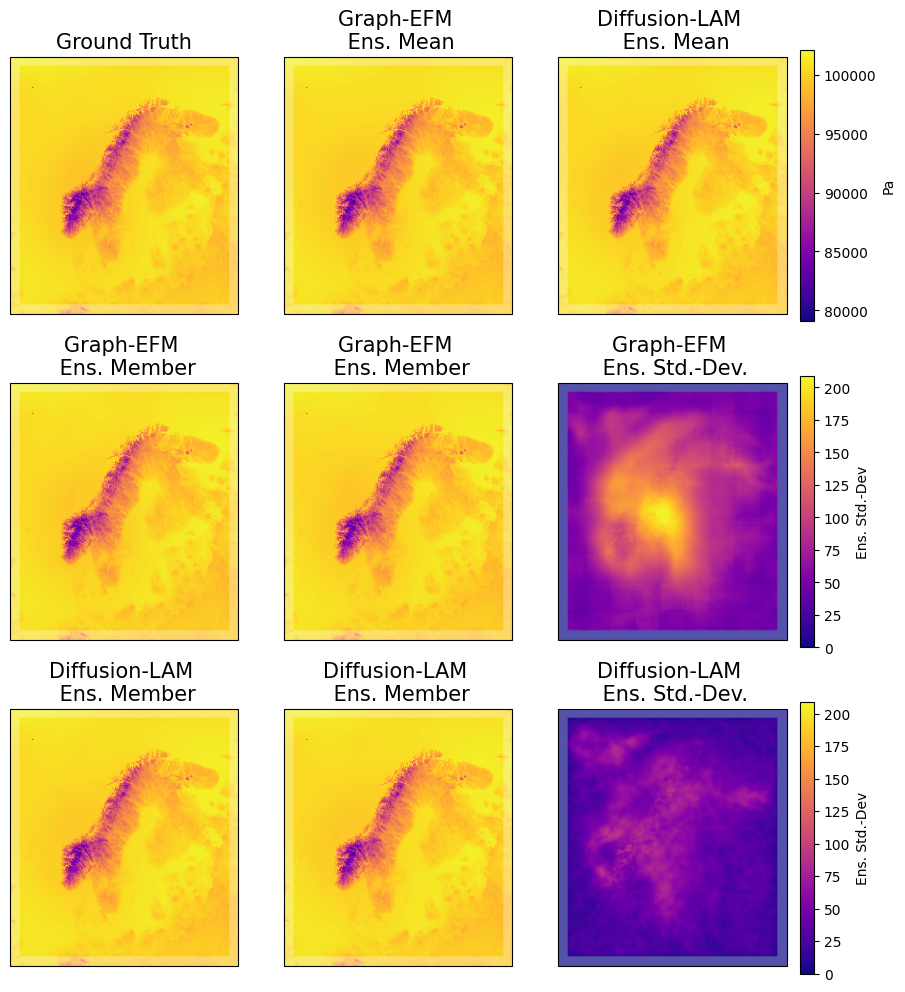

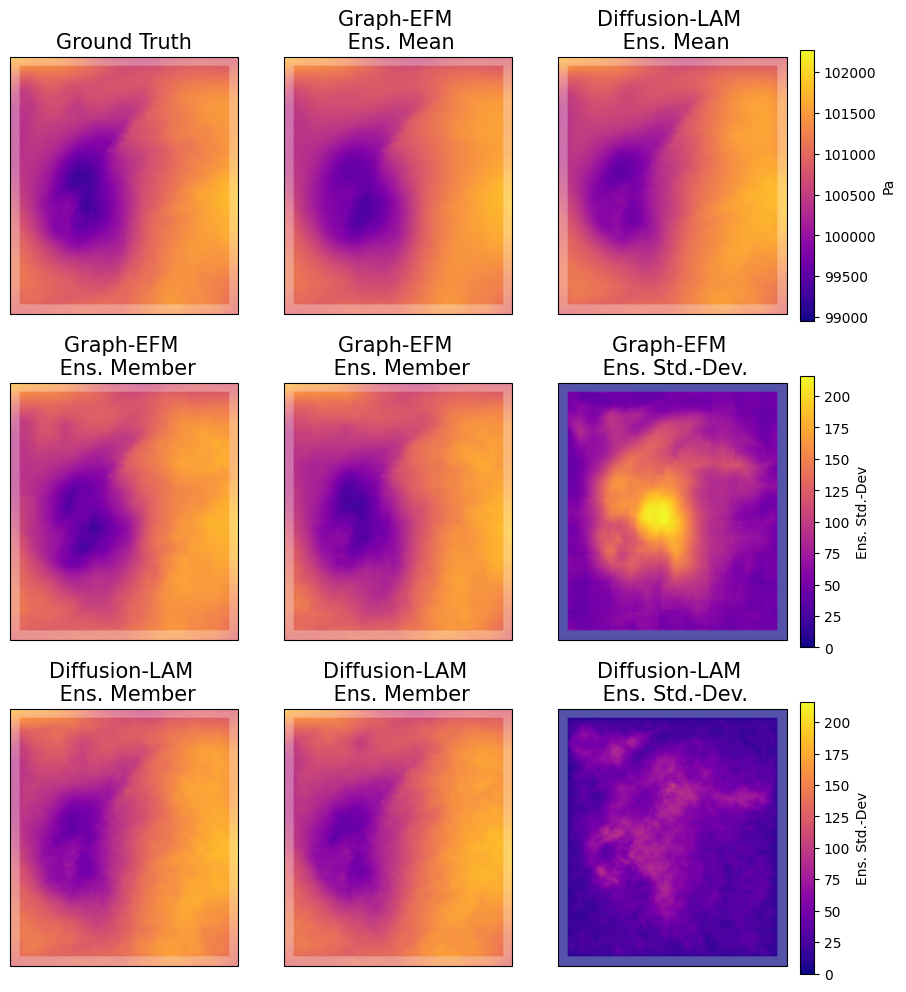

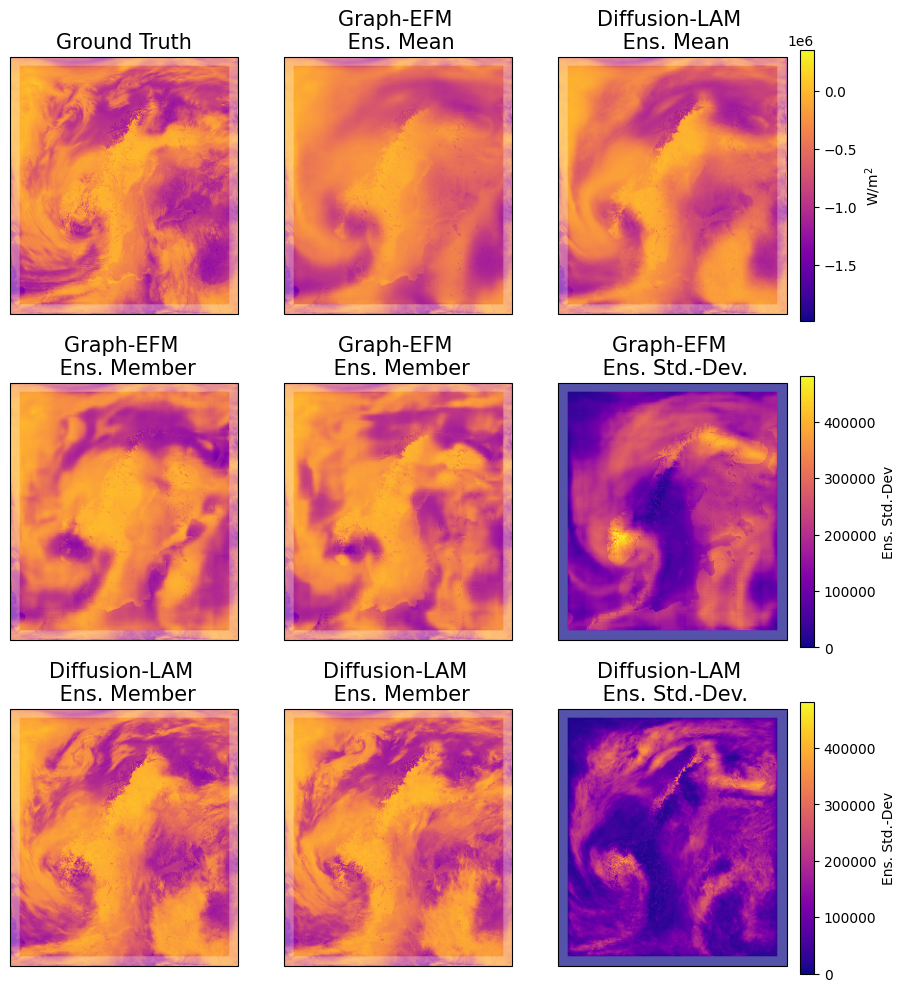

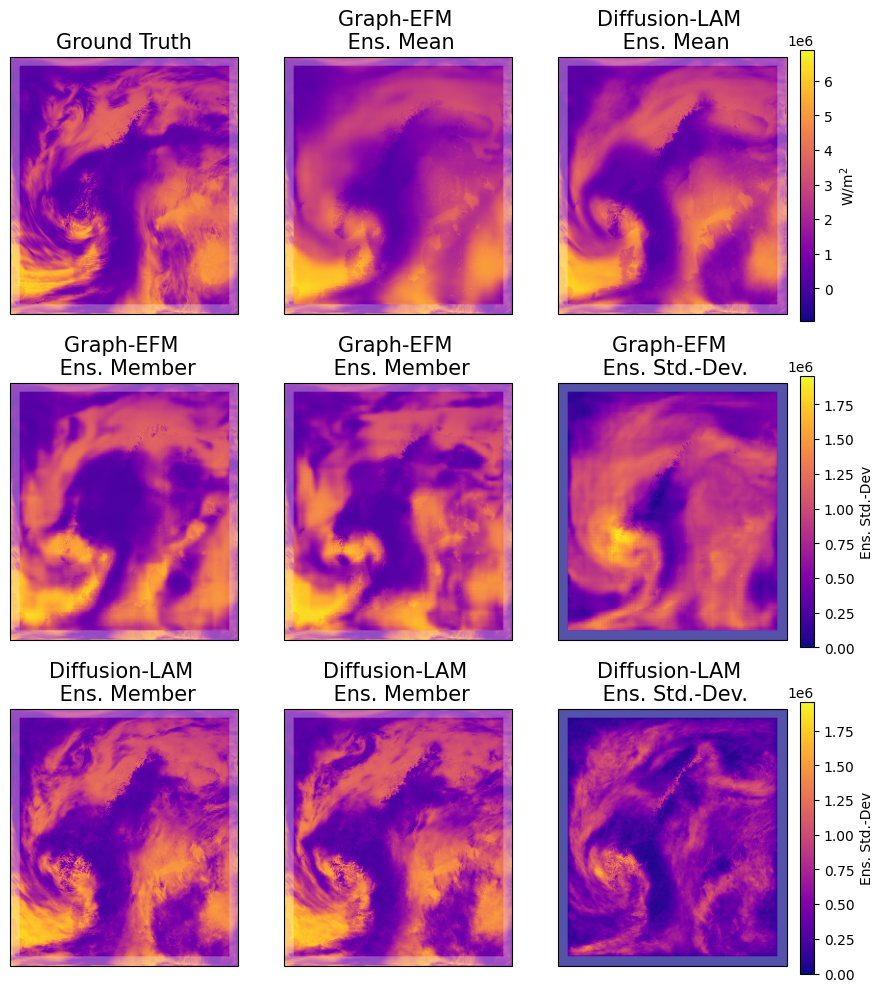

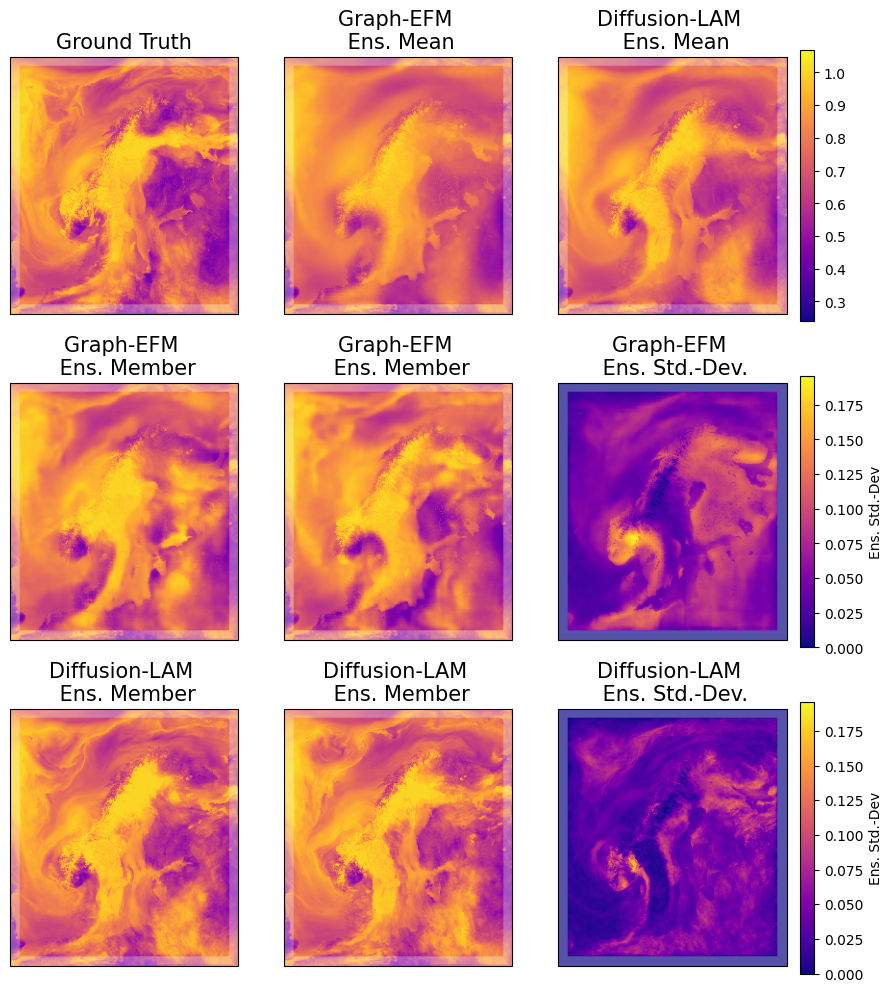

...

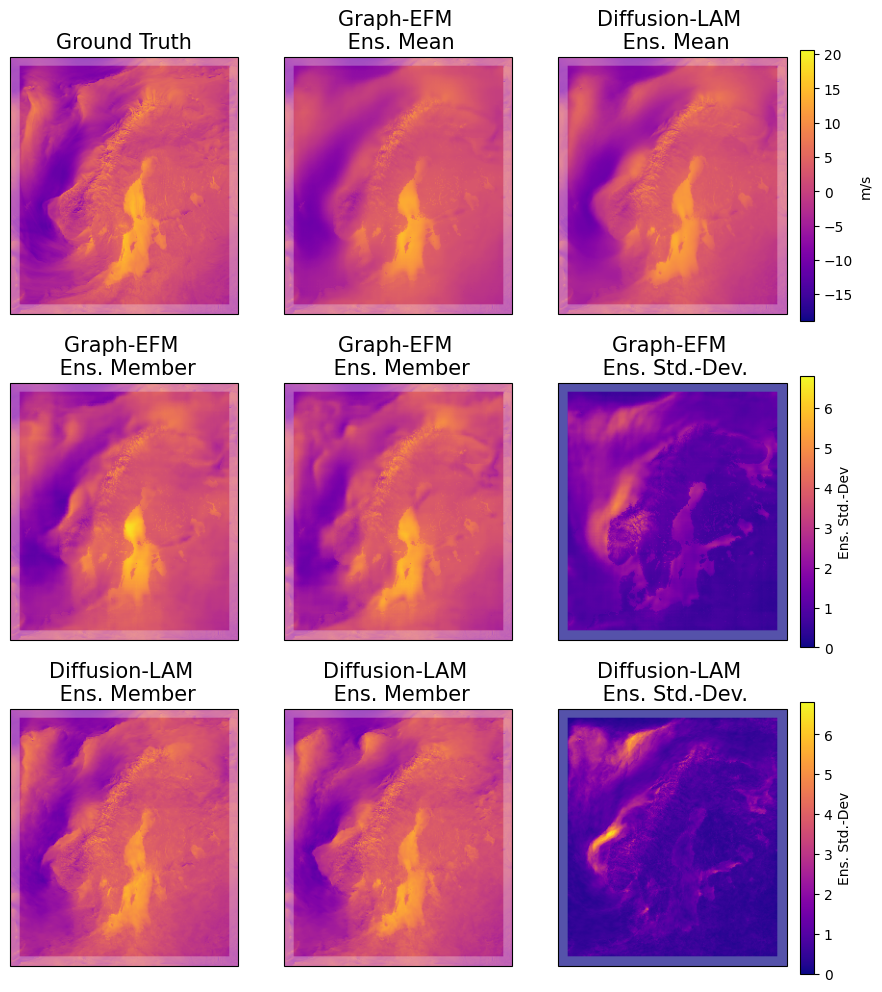

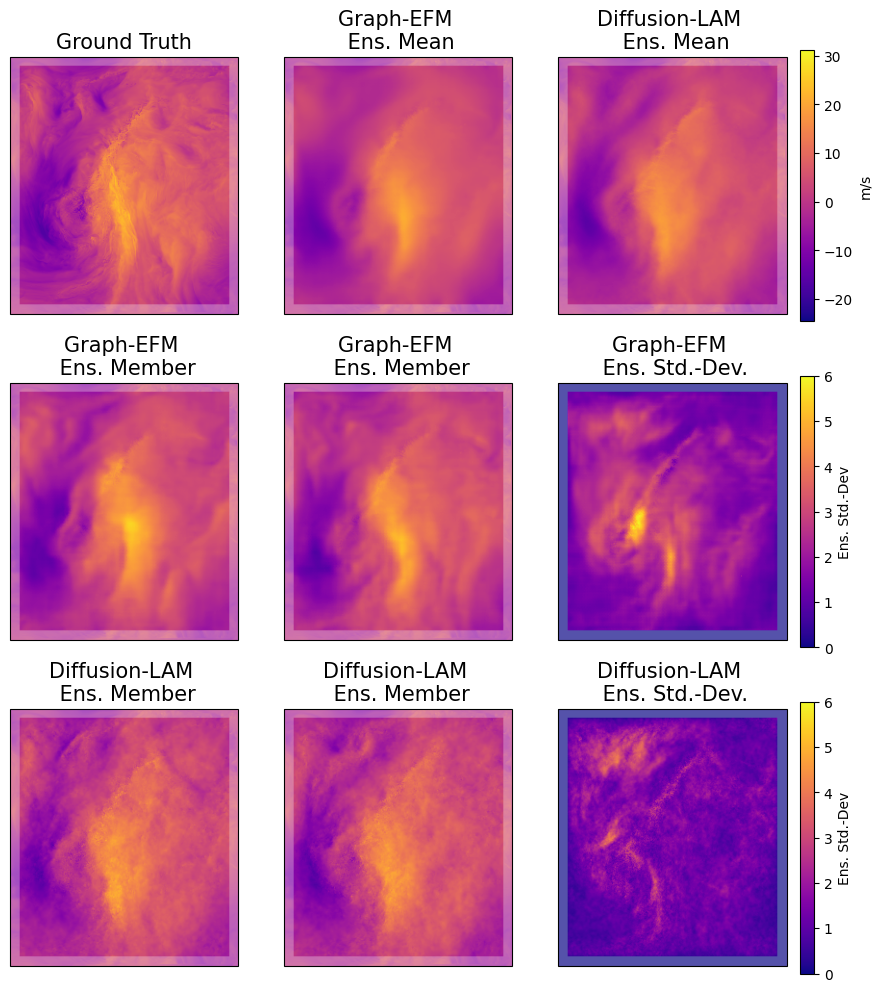

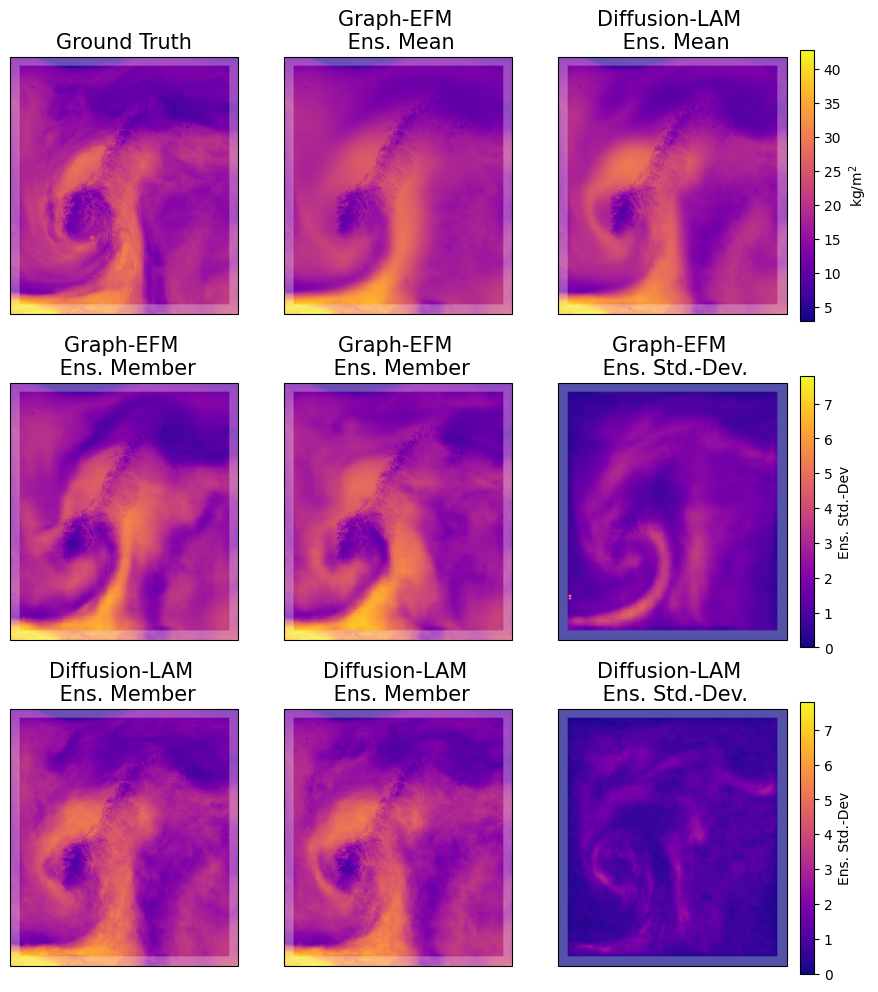

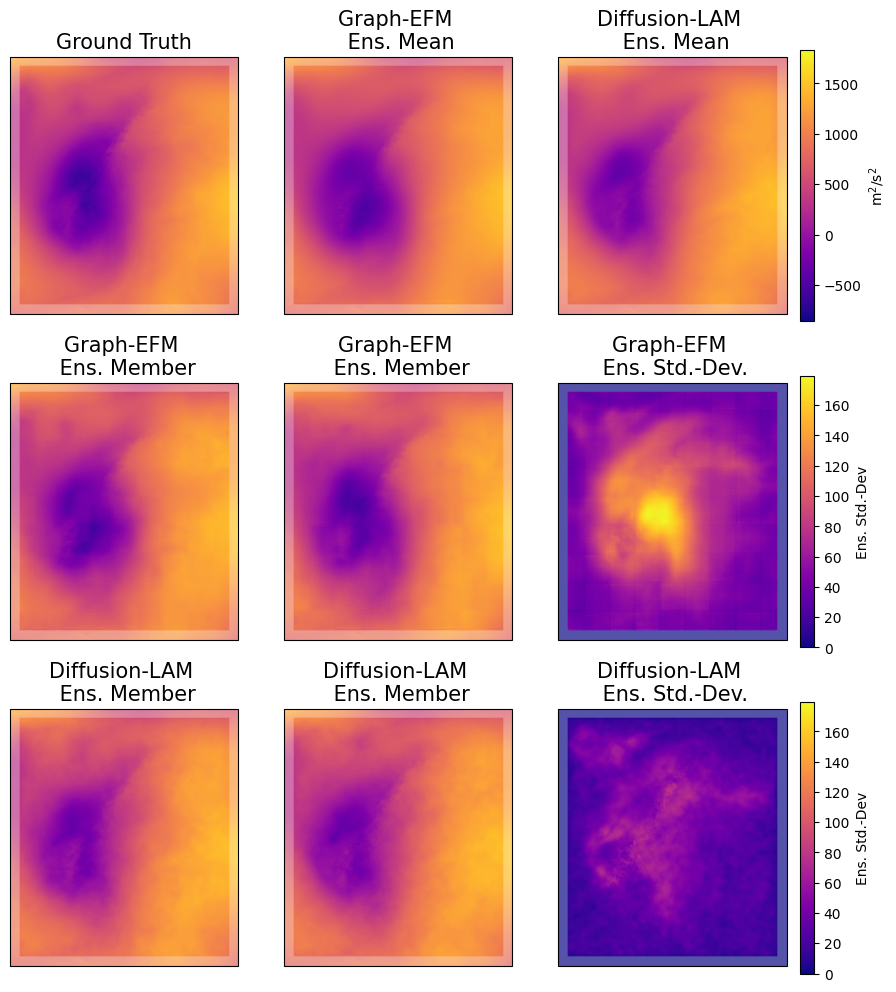

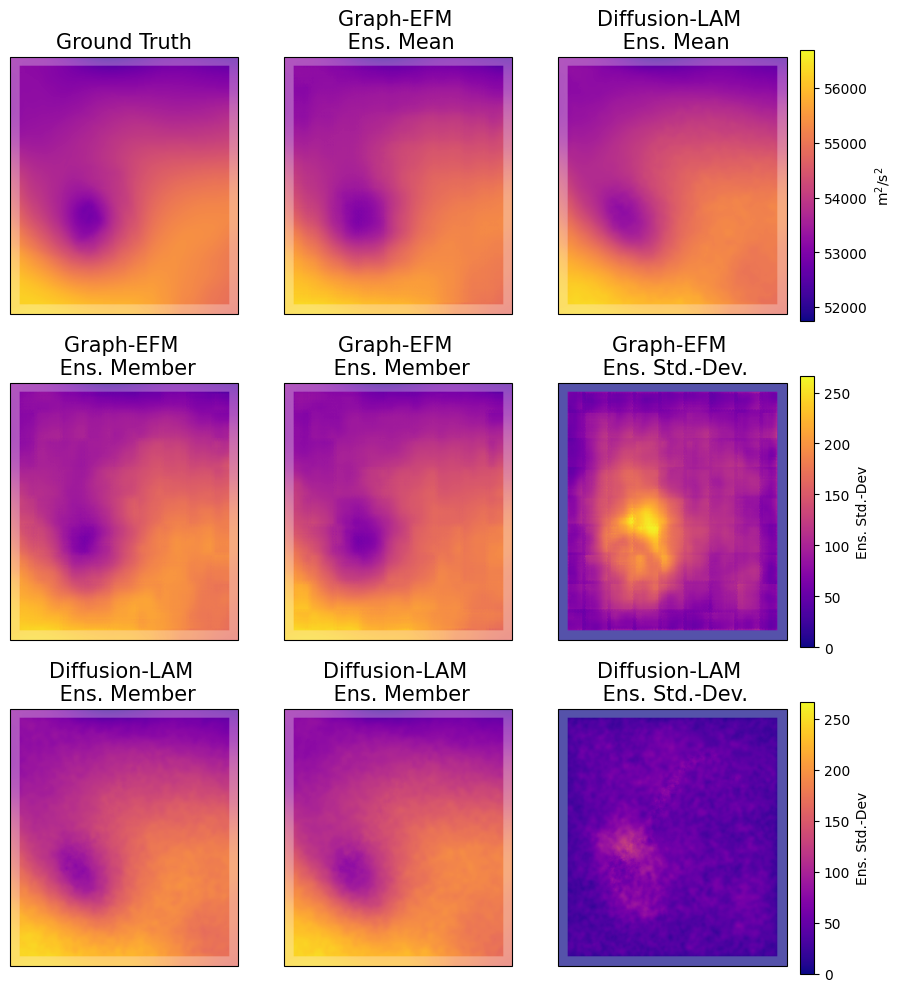

In [114]:
for var_dim, unit in enumerate(data_config.dataset.var_units):

    # Set Vmin and Vmax for samples
    # Dynamically compute vmin and vmax across all models in model_lookup
    vmin = float("inf")
    vmax = float("-inf")
    vmin_std = float("inf")
    vmax_std = float("-inf")

    for model in model_lookup.values():
        predictions = model["predictions"]
        vmin = min(
        predictions["target"][..., var_dim].min(),
        predictions["ens_mean"][..., var_dim].min(),
        predictions["ens_members"][..., var_dim].min(),
        vmin
        )

        vmax = max(
            predictions["target"][..., var_dim].max(),
            predictions["ens_mean"][..., var_dim].max(),
            predictions["ens_members"][..., var_dim].max(),
            vmax
        )

        # Set Vmin and Vmax for std
        vmax_std = max(predictions["ens_std"][..., var_dim].max(), vmax_std)
        vmin_std = min(predictions["ens_std"][..., var_dim].min(), vmin_std)

    # Comparison with Graph-EFM All Samples
    fig, axes = plt.subplots(
        3,
        3,
        figsize=(12, 12),
        subplot_kw={"projection": data_config.coords_projection},
    )

    # First row
    im = plot_on_axis(axes[0,0], model_lookup["prob_hi"]["predictions"]["target"][time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], vmin=vmin, vmax=vmax)
    axes[0,0].set_title("Ground Truth", size=15)
    fig.colorbar(im, ax=axes[0, 0:3], orientation='vertical', location="right", label=unit, shrink=1, pad=0.015)

    im = plot_on_axis(axes[0,1], model_lookup["prob_hi"]["predictions"]["ens_mean"][time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], vmin=vmin, vmax=vmax)
    axes[0,1].set_title("Graph-EFM \n Ens. Mean", size=15)

    im = plot_on_axis(axes[0,2], model_lookup["diff"]["predictions"]["ens_mean"][time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], border_data=model_lookup["diff"]["predictions"]["border"][time_step, :, var_dim], vmin=vmin, vmax=vmax)
    axes[0,2].set_title("Diffusion-LAM \n Ens. Mean", size=15)

    # Second row Graph-EFM
    im = plot_on_axis(axes[1,0], model_lookup["prob_hi"]["predictions"]["ens_members"][0, time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], vmin=vmin, vmax=vmax)
    axes[1,0].set_title("Graph-EFM \n Ens. Member", size=15)

    im = plot_on_axis(axes[1,1], model_lookup["prob_hi"]["predictions"]["ens_members"][1, time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], vmin=vmin, vmax=vmax)
    axes[1,1].set_title("Graph-EFM \n Ens. Member", size=15)

    im = plot_on_axis(axes[1,2], model_lookup["prob_hi"]["predictions"]["ens_std"][time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], vmin=vmin_std, vmax=vmax_std)
    axes[1,2].set_title("Graph-EFM \n Ens. Std.-Dev.", size=15)
    cbar = fig.colorbar(im, ax=axes[1, 0:3], orientation='vertical', label="Ens. Std.-Dev", shrink=1, pad=0.015)

    # Third row Diffusion-LAM
    im = plot_on_axis(axes[2,0], model_lookup["diff"]["predictions"]["ens_members"][0, time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], border_data=model_lookup["diff"]["predictions"]["border"][time_step, :, var_dim], vmin=vmin, vmax=vmax)
    axes[2,0].set_title("Diffusion-LAM \n Ens. Member", size=15)

    im = plot_on_axis(axes[2,1], model_lookup["diff"]["predictions"]["ens_members"][1, time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], border_data=model_lookup["diff"]["predictions"]["border"][time_step, :, var_dim], vmin=vmin, vmax=vmax)
    axes[2,1].set_title("Diffusion-LAM \n Ens. Member", size=15)

    im = plot_on_axis(axes[2,2], model_lookup["diff"]["predictions"]["ens_std"][time_step, :, var_dim], obs_mask=static_data_dict["interior_mask"], border_data=model_lookup["diff"]["predictions"]["border"][time_step, :, var_dim]*0, vmin=vmin_std, vmax=vmax_std)
    axes[2,2].set_title("Diffusion-LAM \n Ens. Std.-Dev.", size=15)
    cbar = fig.colorbar(im, ax=axes[2, 0:3], orientation='vertical', label="Ens. Std.-Dev", shrink=1, pad=0.015)
    
    fig.savefig(f'{output_path}/{data_config.dataset.var_names[var_dim]}.pdf', format='pdf', bbox_inches='tight')

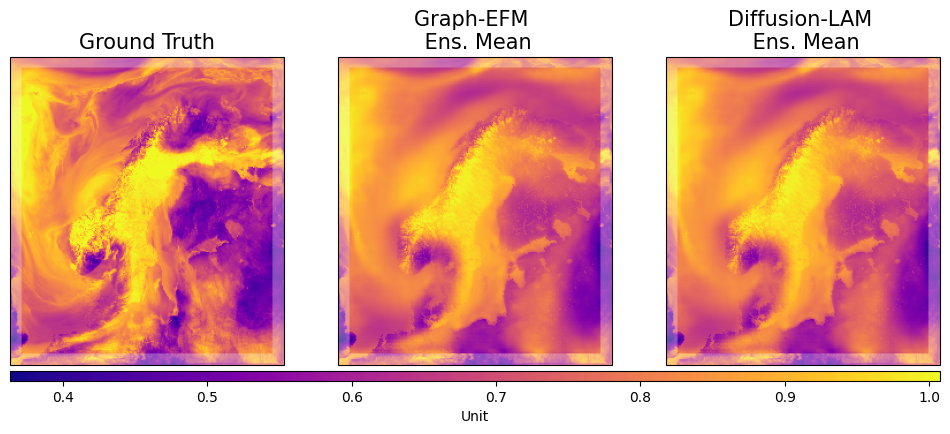

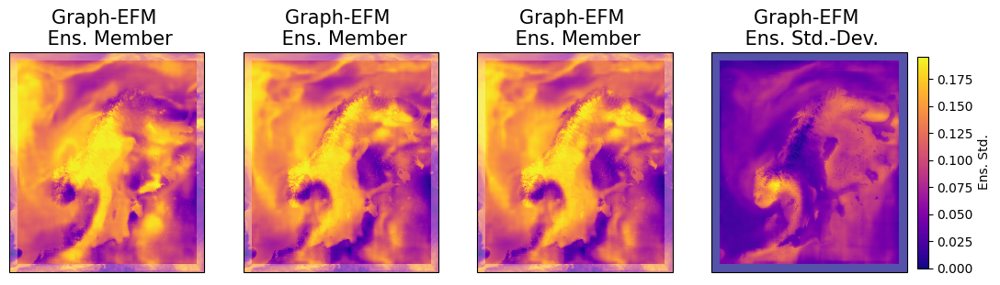

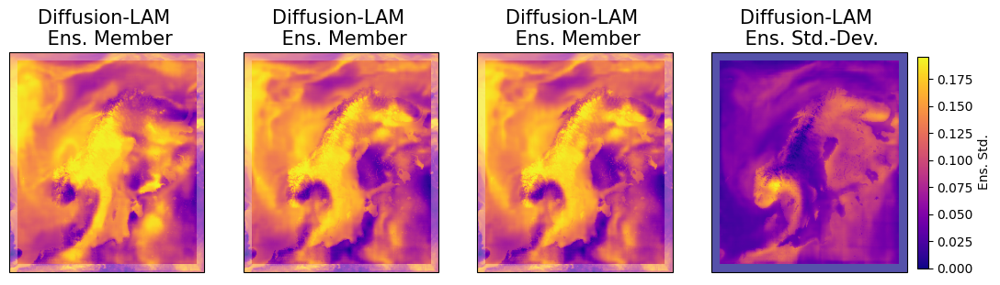

In [40]:
# Top Row
top_row, axes = plt.subplots(
    1,
    3,
    figsize=(12, 8),
    subplot_kw={"projection": data_config.coords_projection},
)

# First row
im = plot_on_axis(axes[0], model_lookup["prob_hi"]["predictions"]["target"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[0].set_title("Ground Truth", size=15)
# cbar = fig.colorbar(im, ax=axes[0:3], orientation='horizontal', label="Unit", pad=0.01, aspect=100, shrink=1, fraction=0.1)

im = plot_on_axis(axes[1], model_lookup["prob_hi"]["predictions"]["ens_mean"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[1].set_title("Graph-EFM \n Ens. Mean", size=15)

im = plot_on_axis(axes[2], model_lookup["prob_hi"]["predictions"]["ens_mean"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[2].set_title("Diffusion-LAM \n Ens. Mean", size=15)
cbar = top_row.colorbar(im, ax=axes[0:3], orientation='horizontal', label="Unit", pad=0.01, aspect=100, shrink=1, fraction=0.1, location='bottom')


# Ensemble members
ens_EFM, axes = plt.subplots(
    1,
    4,
    figsize=(15, 15),
    subplot_kw={"projection": data_config.coords_projection},
)

im = plot_on_axis(axes[0], model_lookup["prob_hi"]["predictions"]["ens_members"][0, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[0].set_title("Graph-EFM \n Ens. Member", size=15)
# cbar = ens_EFM.colorbar(im, ax=axes[0:4], orientation='horizontal', label="Unit", pad=0.01, aspect=100, shrink=1, fraction=0.1, location='bottom')

im = plot_on_axis(axes[1], model_lookup["prob_hi"]["predictions"]["ens_members"][1, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[1].set_title("Graph-EFM \n Ens. Member", size=15)

im = plot_on_axis(axes[2], model_lookup["prob_hi"]["predictions"]["ens_members"][1, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[2].set_title("Graph-EFM \n Ens. Member", size=15)

im = plot_on_axis(axes[3], model_lookup["prob_hi"]["predictions"]["ens_std"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[3].set_title("Graph-EFM \n Ens. Std.-Dev.", size=15)
cbar = ens_EFM.colorbar(im, ax=axes[0:4], orientation='vertical', location="right", label="Ens. Std.", pad=0.01, shrink=0.2)

# Ensemble members
ens_Diff, axes = plt.subplots(
    1,
    4,
    figsize=(15, 15),
    subplot_kw={"projection": data_config.coords_projection},
)

im = plot_on_axis(axes[0], model_lookup["prob_hi"]["predictions"]["ens_members"][0, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[0].set_title("Diffusion-LAM \n Ens. Member", size=15)

im = plot_on_axis(axes[1], model_lookup["prob_hi"]["predictions"]["ens_members"][1, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[1].set_title("Diffusion-LAM \n Ens. Member", size=15)

im = plot_on_axis(axes[2], model_lookup["prob_hi"]["predictions"]["ens_members"][1, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[2].set_title("Diffusion-LAM \n Ens. Member", size=15)

im = plot_on_axis(axes[3], model_lookup["prob_hi"]["predictions"]["ens_std"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
axes[3].set_title("Diffusion-LAM \n Ens. Std.-Dev.", size=15)
cbar = ens_Diff.colorbar(im, ax=axes[0:4], orientation='vertical', location="right", label="Ens. Std.", pad=0.01, shrink=0.2)

#plt.tight_layout()



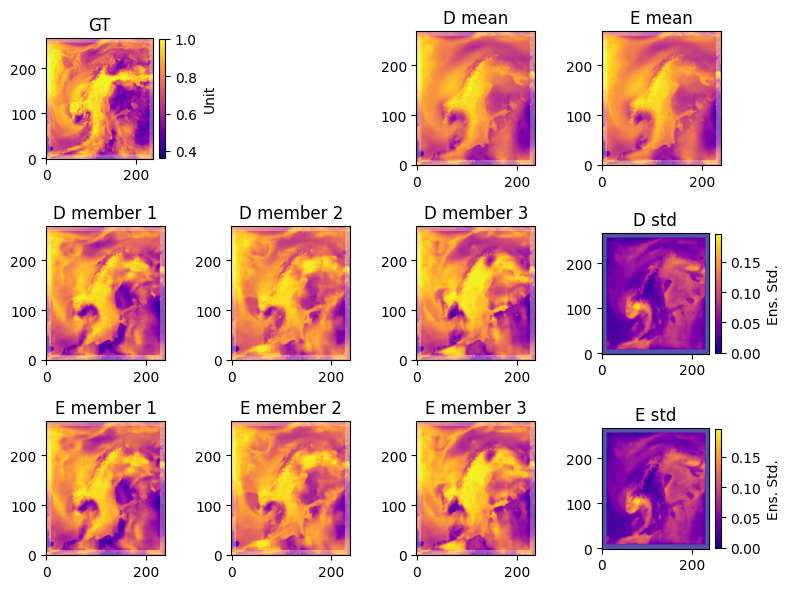

In [41]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np

# Create the figure and define the grid layout
fig = plt.figure(figsize=(8, 6))
gs = GridSpec(3, 4, figure=fig)  # 4 rows and 4 columns

# Define axes for each section
ax_gt = fig.add_subplot(gs[0, 0:1])  # GT: Rows 0-1, Columns 0-1
ax_d_mean = fig.add_subplot(gs[0, 2])  # D mean: Row 0, Column 2
ax_e_mean = fig.add_subplot(gs[0, 3])  # E mean: Row 1, Column 2

ax_d_std = fig.add_subplot(gs[1, 3])  # D std: Row 0, Column 3
ax_e_std = fig.add_subplot(gs[2, 3])  # E std: Row 1, Column 3
ax_d_member1 = fig.add_subplot(gs[1, 0])  # D member 1: Row 2, Column 0
ax_d_member2 = fig.add_subplot(gs[1, 1])  # D member 2: Row 2, Column 1
ax_d_member3 = fig.add_subplot(gs[1, 2])  # D member 3: Row 2, Column 2
ax_e_member1 = fig.add_subplot(gs[2, 0])  # E member 1: Row 3, Column 0
ax_e_member2 = fig.add_subplot(gs[2, 1])  # E member 2: Row 3, Column 1
ax_e_member3 = fig.add_subplot(gs[2, 2])  # E member 3: Row 3, Column 2

# Plot example data
# im = ax_gt.imshow(data, cmap="viridis")
im = plot_on_axis(ax_gt, model_lookup["prob_hi"]["predictions"]["target"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_gt.set_title("GT")
cbar = fig.colorbar(im, orientation='vertical', location="right", label="Unit", shrink=1, fraction=0.05, pad=0.05,)

im = plot_on_axis(ax_d_mean, model_lookup["prob_hi"]["predictions"]["ens_mean"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_d_mean.set_title("D mean")

im = plot_on_axis(ax_d_std, model_lookup["prob_hi"]["predictions"]["ens_std"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_d_std.set_title("D std")
cbar = fig.colorbar(im, orientation='vertical', label="Ens. Std.", fraction=0.05)

im = plot_on_axis(ax_e_mean, model_lookup["prob_hi"]["predictions"]["ens_mean"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_e_mean.set_title("E mean")

im = plot_on_axis(ax_e_std, model_lookup["prob_hi"]["predictions"]["ens_std"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_e_std.set_title("E std")
cbar = fig.colorbar(im, orientation='vertical', label="Ens. Std.", fraction=0.05)

for i, ax in enumerate([ax_d_member1, ax_d_member2, ax_d_member3], start=1):
    im = plot_on_axis(ax, model_lookup["prob_hi"]["predictions"]["ens_members"][i, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
    ax.set_title(f"D member {i}")

for i, ax in enumerate([ax_e_member1, ax_e_member2, ax_e_member3], start=1):
    im = plot_on_axis(ax, model_lookup["prob_hi"]["predictions"]["ens_members"][i, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
    ax.set_title(f"E member {i}")

# Adjust layout
#plt.subplots_adjust(wspace=0.00000001, hspace=0.4)  # Remove space between subplots
plt.tight_layout()
plt.show()

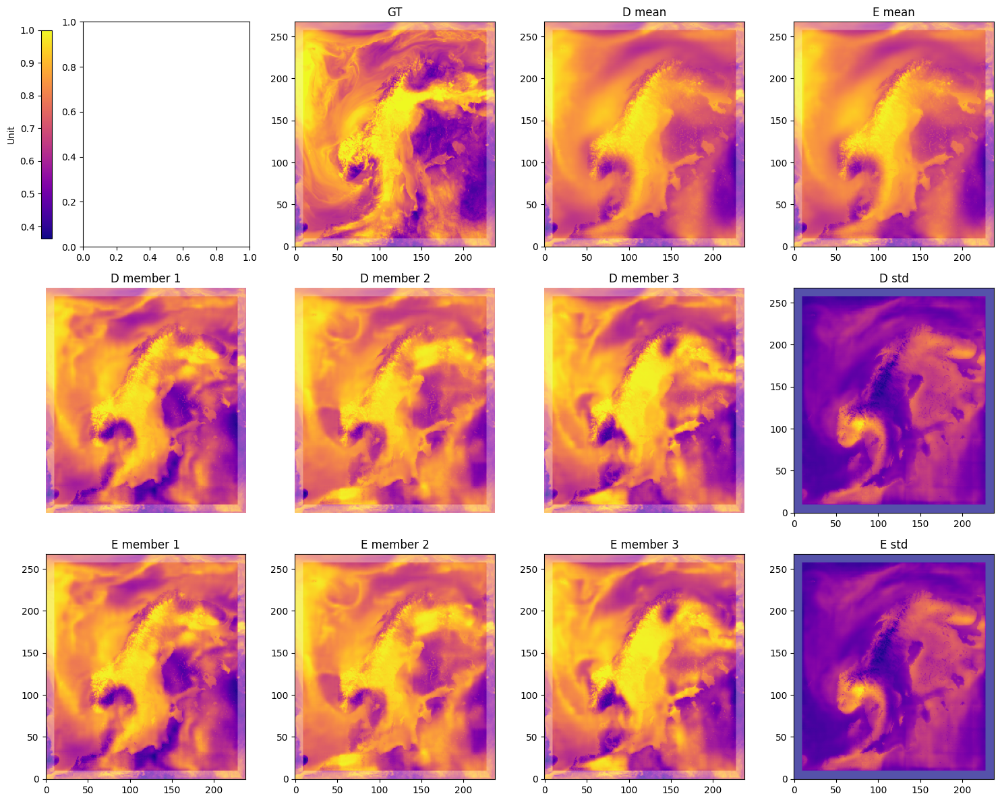

In [42]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np

# Create the figure and define the grid layout
fig = plt.figure(figsize=(15, 12))
gs = GridSpec(3, 4, figure=fig)  # 4 rows and 4 columns

# Define axes for each section
ax_colorbar = fig.add_subplot(gs[0, 0])  # GT: Rows 0-1, Columns 0-1
ax_gt = fig.add_subplot(gs[0, 1])  # GT: Rows 0-1, Columns 0-1
ax_d_mean = fig.add_subplot(gs[0, 2])  # D mean: Row 0, Column 2
ax_e_mean = fig.add_subplot(gs[0, 3])  # E mean: Row 1, Column 2

ax_d_std = fig.add_subplot(gs[1, 3])  # D std: Row 0, Column 3
ax_e_std = fig.add_subplot(gs[2, 3])  # E std: Row 1, Column 3
ax_d_member1 = fig.add_subplot(gs[1, 0])  # D member 1: Row 2, Column 0
ax_d_member2 = fig.add_subplot(gs[1, 1])  # D member 2: Row 2, Column 1
ax_d_member3 = fig.add_subplot(gs[1, 2])  # D member 3: Row 2, Column 2
ax_e_member1 = fig.add_subplot(gs[2, 0])  # E member 1: Row 3, Column 0
ax_e_member2 = fig.add_subplot(gs[2, 1])  # E member 2: Row 3, Column 1
ax_e_member3 = fig.add_subplot(gs[2, 2])  # E member 3: Row 3, Column 2

# Plot example data
im = plot_on_axis(ax_gt, model_lookup["prob_hi"]["predictions"]["target"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_gt.set_title("GT")
cbar = fig.colorbar(im, ax=ax_colorbar, orientation='vertical', location="left", label="Unit", shrink=1, fraction=0.05, pad=0.15,)

im = plot_on_axis(ax_d_mean, model_lookup["prob_hi"]["predictions"]["ens_mean"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_d_mean.set_title("D mean")

im = plot_on_axis(ax_d_std, model_lookup["prob_hi"]["predictions"]["ens_std"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_d_std.set_title("D std")
# cbar = fig.colorbar(im, orientation='vertical', label="Ens. Std.", fraction=0.05)

im = plot_on_axis(ax_e_mean, model_lookup["prob_hi"]["predictions"]["ens_mean"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_e_mean.set_title("E mean")

im = plot_on_axis(ax_e_std, model_lookup["prob_hi"]["predictions"]["ens_std"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_e_std.set_title("E std")
# cbar = fig.colorbar(im, orientation='vertical', label="Ens. Std.", fraction=0.05)

for i, ax in enumerate([ax_d_member1, ax_d_member2, ax_d_member3], start=1):
    im = plot_on_axis(ax, model_lookup["prob_hi"]["predictions"]["ens_members"][i, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
    ax.set_title(f"D member {i}")
    ax.axis("off")

for i, ax in enumerate([ax_e_member1, ax_e_member2, ax_e_member3], start=1):
    im = plot_on_axis(ax, model_lookup["prob_hi"]["predictions"]["ens_members"][i, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
    ax.set_title(f"E member {i}")

# Adjust layout
#plt.subplots_adjust(wspace=0.00000001, hspace=0.4)  # Remove space between subplots
plt.tight_layout()
plt.show()

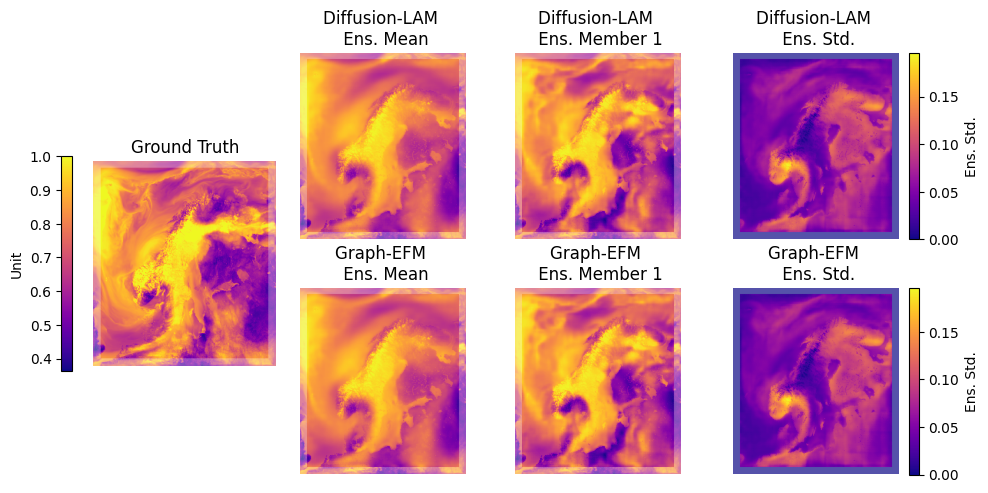

In [43]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np

# Create the figure and define the grid layout
fig = plt.figure(figsize=(10, 5))
gs = GridSpec(2, 4, figure=fig)  # 4 rows and 4 columns

# Define axes for each section
ax_gt = fig.add_subplot(gs[0:2, 0])  # GT: Rows 0-1, Columns 0-1
ax_d_mean = fig.add_subplot(gs[0, 1])  # D mean: Row 0, Column 2
ax_e_mean = fig.add_subplot(gs[1, 1])  # E mean: Row 1, Column 2

ax_d_std = fig.add_subplot(gs[0, 3])  # D std: Row 0, Column 3
ax_e_std = fig.add_subplot(gs[1, 3])  # E std: Row 1, Column 3

ax_d_member1 = fig.add_subplot(gs[0, 2])  # D member 1: Row 2, Column 0
# ax_d_member2 = fig.add_subplot(gs[1, 1])  # D member 2: Row 2, Column 1
# ax_d_member3 = fig.add_subplot(gs[1, 2])  # D member 3: Row 2, Column 2

ax_e_member1 = fig.add_subplot(gs[1, 2])  # E member 1: Row 3, Column 0
# ax_e_member2 = fig.add_subplot(gs[2, 1])  # E member 2: Row 3, Column 1
# ax_e_member3 = fig.add_subplot(gs[2, 2])  # E member 3: Row 3, Column 2

# Plot example data
im = plot_on_axis(ax_gt, model_lookup["prob_hi"]["predictions"]["target"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_gt.set_title("Ground Truth")
cbar = fig.colorbar(im, orientation='vertical', location="left", label="Unit", shrink=0.95, fraction=0.05)
ax_gt.axis("off")

im = plot_on_axis(ax_d_mean, model_lookup["prob_hi"]["predictions"]["ens_mean"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_d_mean.set_title("Diffusion-LAM \n Ens. Mean")
ax_d_mean.axis("off")

im = plot_on_axis(ax_d_std, model_lookup["prob_hi"]["predictions"]["ens_std"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_d_std.set_title("Diffusion-LAM \n Ens. Std.")
ax_d_std.axis("off")
cbar = fig.colorbar(im, orientation='vertical', label="Ens. Std.", fraction=0.05)

im = plot_on_axis(ax_e_mean, model_lookup["prob_hi"]["predictions"]["ens_mean"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_e_mean.set_title("Graph-EFM \n Ens. Mean")
ax_e_mean.axis("off")

im = plot_on_axis(ax_e_std, model_lookup["prob_hi"]["predictions"]["ens_std"][time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
ax_e_std.set_title("Graph-EFM \n Ens. Std.")
ax_e_std.axis("off")
cbar = fig.colorbar(im, orientation='vertical', label="Ens. Std.", fraction=0.05)

for i, ax in enumerate([ax_d_member1], start=1):
    im = plot_on_axis(ax, model_lookup["prob_hi"]["predictions"]["ens_members"][i, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
    ax.set_title(f"Diffusion-LAM \n Ens. Member {i}")
    ax.axis("off")

for i, ax in enumerate([ax_e_member1], start=1):
    im = plot_on_axis(ax, model_lookup["prob_hi"]["predictions"]["ens_members"][i, time_step, :, 4], obs_mask=static_data_dict["interior_mask"])
    ax.set_title(f"Graph-EFM \n Ens. Member {i}")
    ax.axis("off")


# Adjust layout
# plt.subplots_adjust(wspace=0.01, hspace=0.26)  # Remove space between subplots
plt.tight_layout()
plt.subplots_adjust(wspace=0.00000000000000001, hspace=0.26)
plt.show()